In [56]:
import torch
import torch.nn as nn
import torch.nn.functional
import matplotlib.pyplot as plt
import numpy
import plotly.graph_objects
import os
import glob
import random
from PIL import Image
from torchvision import transforms
from tqdm import tqdm


SAMPLING_RATE = 100 # Hz
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

def get_device():
    return torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

device = get_device()
print(f"Using device: {device}")
# print(f"Device name: {torch.cuda.get_device_name(0)}")


class ImageIterator:
    def __init__(self, folder_path, val_split=0.2, random_seed=42):
        # Set random seed for reproducibility
        random.seed(random_seed)
        
        # Combine jpg and jpeg files
        self.image_paths = []
        for ext in ['*.jpg', '*.jpeg']:
            self.image_paths.extend(glob.glob(os.path.join(folder_path, ext)))
        
        self.total_images = len(self.image_paths)
        print(f"Found {self.total_images} jpg/jpeg images")
        
        # Randomly shuffle the image paths
        random.shuffle(self.image_paths)
        
        # Calculate split point
        val_size = int(self.total_images * val_split)
        
        # Split into training and validation sets
        self.train_paths = self.image_paths[val_size:]
        self.val_paths = self.image_paths[:val_size]
        
        print(f"Split into {len(self.train_paths)} training and {len(self.val_paths)} validation images")
    
    def get_train_paths(self):
        return self.train_paths
    
    def get_val_paths(self):
        return self.val_paths
    
    def __getitem__(self, idx):
        # By default, operate on training set
        if isinstance(idx, int):
            if idx < 0 or idx >= len(self.train_paths):
                raise IndexError("Image index out of range")
            return self.train_paths[idx]
        elif isinstance(idx, slice):
            return self.train_paths[idx]
        else:
            raise TypeError("Index must be int or slice")
    
    def __len__(self):
        return len(self.train_paths)


def convert_image_to_tensor(image_path, target_width=64, target_height=64):
    """Converts a single image to tensor with specified dimensions"""
    transform = transforms.Compose([
        transforms.Resize((target_height, target_width), 
                         interpolation=transforms.InterpolationMode.NEAREST),
        transforms.ToTensor(),
    ])
    
    try:
        with Image.open(image_path) as img:
            img = img.convert('RGB')
            return transform(img)
    except Exception as e:
        print(f"Error processing {image_path}: {str(e)}")
        return None



def show_image(tensor, figsize=(8,8), title=None):
    """
    Displays a single image tensor.
    
    Args:
        tensor (torch.Tensor): Image tensor of shape (3, height, width)
        figsize (tuple): Figure size (width, height)
        title (str, optional): Title for the image
    """
    # Ensure tensor is on CPU and correct format
    img = tensor.detach().cpu()
    
    # Convert from (C,H,W) to (H,W,C)
    img = img.permute(1, 2, 0)
    
    # Scale to [0,255] if in [0,1]
    if img.max() <= 1.0:
        img = img * 255
        
    img = img.numpy().astype('uint8')
    
    plt.figure(figsize=figsize)
    if title:
        plt.title(title)
    plt.axis('off')
    plt.imshow(img)
    plt.show()

def show_images(tensors, num_cols=3, figsize=(15,5), titles=None):
    """
    Displays multiple image tensors in a grid.
    
    Args:
        tensors (list): List of image tensors, each of shape (3, height, width) or (1, 3, height, width)
        num_cols (int): Number of columns in the grid
        figsize (tuple): Figure size (width, height)
        titles (list, optional): List of titles for each image
    """
    num_images = len(tensors)
    num_rows = (num_images + num_cols - 1) // num_cols
    
    plt.figure(figsize=figsize)
    
    for idx, tensor in enumerate(tensors):
        plt.subplot(num_rows, num_cols, idx + 1)
        
        # Ensure tensor is on CPU and remove batch dimension if present
        img = tensor.detach().cpu()
        if img.dim() == 4:  # If tensor has batch dimension
            img = img.squeeze(0)
            
        # Convert from (C, H, W) to (H, W, C)
        img = img.permute(1, 2, 0)
        
        # Scale to [0,255] if in [0,1]
        if img.max() <= 1.0:
            img = img * 255
            
        img = img.numpy().astype('uint8')
        
        # Add title if provided
        if titles and idx < len(titles):
            plt.title(titles[idx])
            
        plt.axis('off')
        plt.imshow(img)
    
    plt.tight_layout()
    plt.show()


class CNNAutoencoder(nn.Module):
    def __init__(self):
        super().__init__()
        
        # Encoder CNN path
        self.encoder_cnn = nn.Sequential(
            # 1080 -> 540
            nn.Conv2d(3, 8, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            # 540 -> 270
            nn.Conv2d(8, 16, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            # 270 -> 135
            nn.Conv2d(16, 8, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            # 135 -> 68
            nn.Conv2d(8, 4, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
        )
        
        self.flattened_dim = 4 * 68 * 68
        self.flatten = nn.Flatten()
        
        self.encoder_linear = nn.Sequential(
            nn.Linear(self.flattened_dim, 4096),
            nn.ReLU(),
            nn.Linear(4096, 3072)
        )
        
        self.decoder_linear = nn.Sequential(
            nn.Linear(3072, 4096),
            nn.ReLU(),
            nn.Linear(4096, self.flattened_dim)
        )
        
        # Decoder CNN path with careful size management
        self.decoder_cnn = nn.Sequential(
            # 68 -> 135
            nn.ConvTranspose2d(4, 8, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            # 135 -> 270
            nn.ConvTranspose2d(8, 16, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            # 270 -> 540
            nn.ConvTranspose2d(16, 8, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            # 540 -> 1080
            nn.ConvTranspose2d(8, 3, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid()
        )
    
    def encode(self, x):
        if x.size(2) != 1080 or x.size(3) != 1080:
            raise ValueError(f"Input must be 1080x1080, got {x.size(2)}x{x.size(3)}")
        
        x = self.encoder_cnn(x)
        x = self.flatten(x)
        return self.encoder_linear(x)
    
    def decode(self, z):
        x = self.decoder_linear(z)
        x = x.view(-1, 4, 68, 68)
        return self.decoder_cnn(x)
    
    def forward(self, x):
        x.to(device)
        z = self.encode(x)
        decoded = self.decode(z)
        
        if decoded.size(2) != 1080 or decoded.size(3) != 1080:
            raise ValueError(f"Output size mismatch: expected 1080x1080, got {decoded.size(2)}x{decoded.size(3)}")
        
        return decoded, z

    @property
    def latent_features(self):
        return 3072



Using device: cuda:0


In [57]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

folder_path = r"D:\Programming\Python\Pytorch\Datasets\Humans"
image_iterator = ImageIterator(folder_path, val_split=0.2)

images = image_iterator.get_train_paths()
val_images = image_iterator.get_val_paths()

model = CNNAutoencoder().to(device)


Using device: cuda
Found 6987 jpg/jpeg images
Split into 5590 training and 1397 validation images


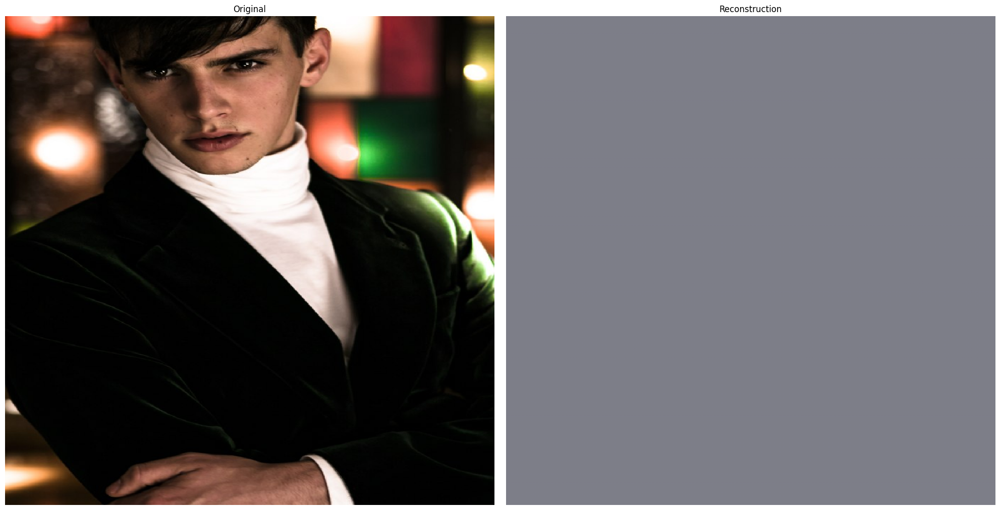

In [58]:
for i in images[0:1]:
    # Get tensor and add batch dimension
    image_tensor = convert_image_to_tensor(i, target_width=1080, target_height=1080)
    image_tensor = image_tensor.unsqueeze(0)  # Add batch dimension
    image_tensor = image_tensor.to(device)    # Move to GPU if available
    
    # When calling the model
    with torch.no_grad():
        reconstruction, z = model.forward(image_tensor)  # Unpack both values

    # Then show images with just the reconstruction tensor
    show_images([image_tensor, reconstruction], 
        num_cols=2, 
        figsize=(20,10),
        titles=['Original', 'Reconstruction'])
    
    # # Optional: clear memory
    del image_tensor
    if torch.cuda.is_available():
        torch.cuda.empty_cache()



In [59]:
# Training parameters
epochs = 5
learning_rate = 1e-3
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
criterion = nn.MSELoss()

for epoch in range(epochs):
    # Training loop for each image
    for i in images:
        # Prepare image
        image_tensor = convert_image_to_tensor(i, target_width=1080, target_height=1080)
        image_tensor = image_tensor.unsqueeze(0).to(device)  # Add batch dimension and move to device
        
        # print(f"Training on image: {os.path.basename(i)}")
        
        # Zero gradients
        optimizer.zero_grad()
        
        # Forward pass
        reconstruction, latent = model(image_tensor)
        
        # Calculate loss
        loss = criterion(reconstruction, image_tensor)
        
        # Backward pass and optimize
        loss.backward()
        optimizer.step()
        
    # Print progress
    if (epoch + 1) % 1 == 0:
        print(f'Epoch [{epoch+1}/{epochs}], Loss: {loss.item():.4f}')

Epoch [1/5], Loss: 0.0169
Epoch [2/5], Loss: 0.0185
Epoch [3/5], Loss: 0.0160
Epoch [4/5], Loss: 0.0152
Epoch [5/5], Loss: 0.0123


Training Images:


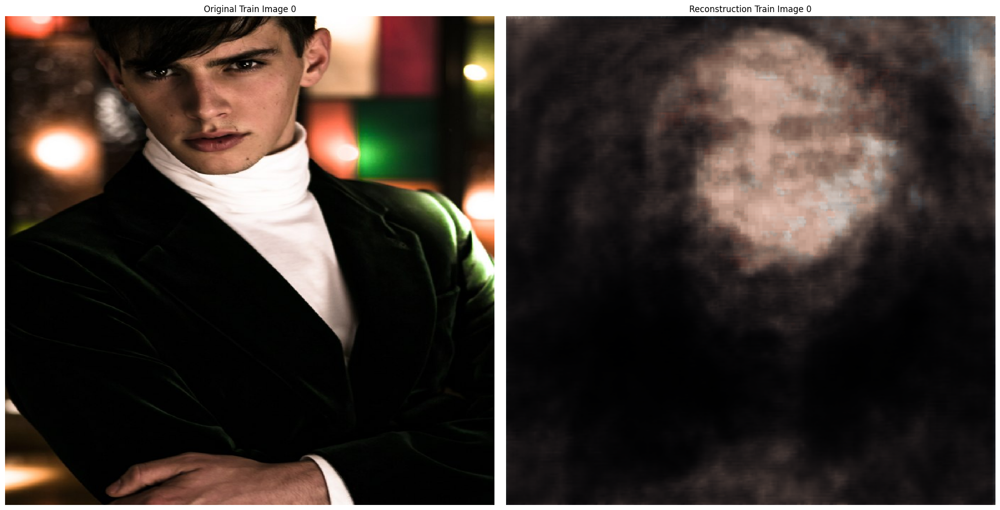

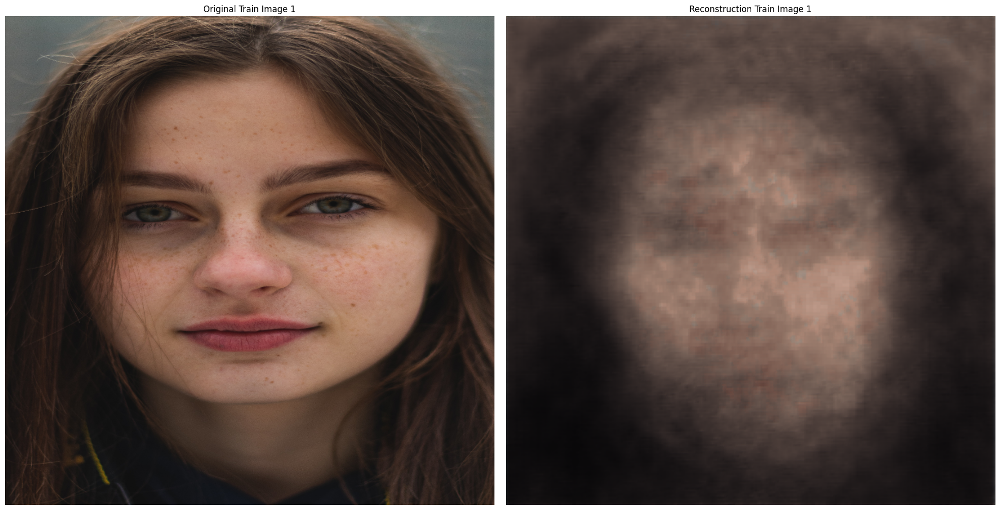

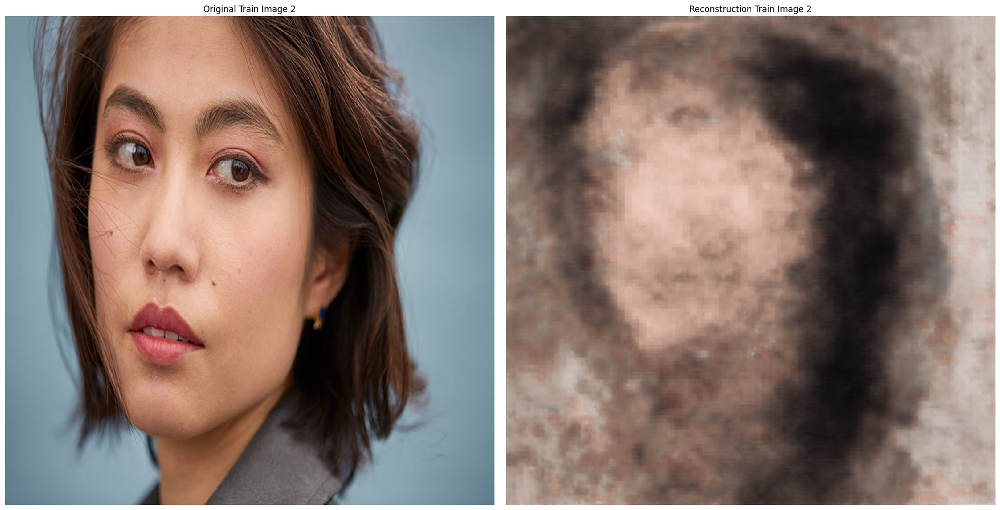


Validation Images:


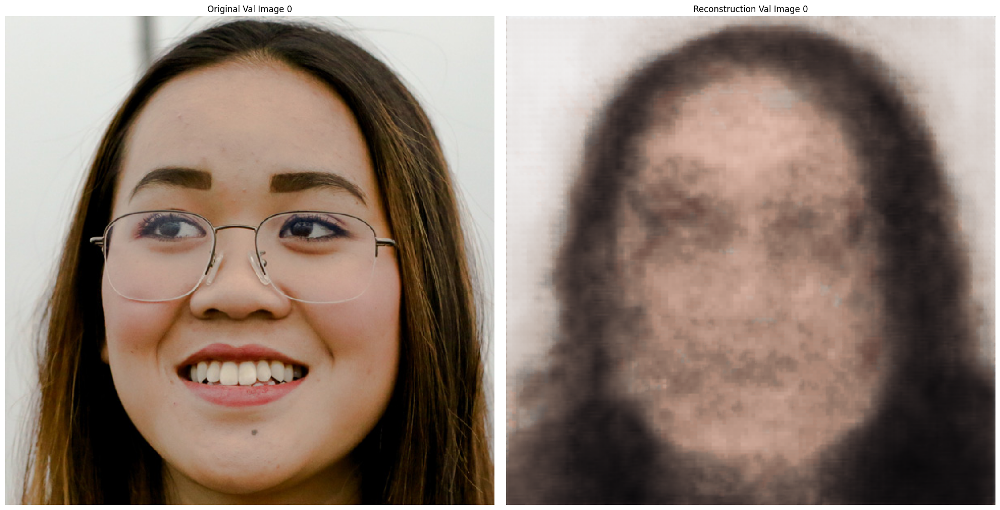

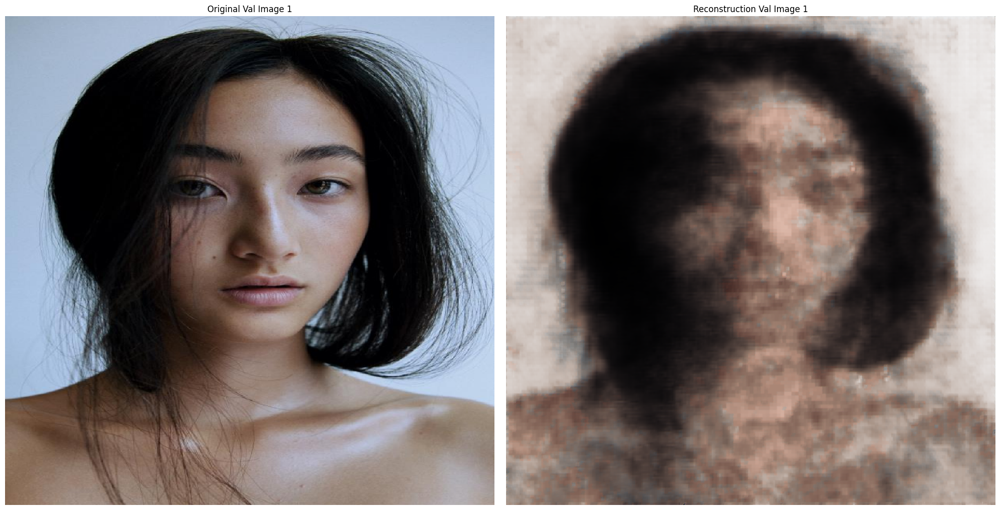

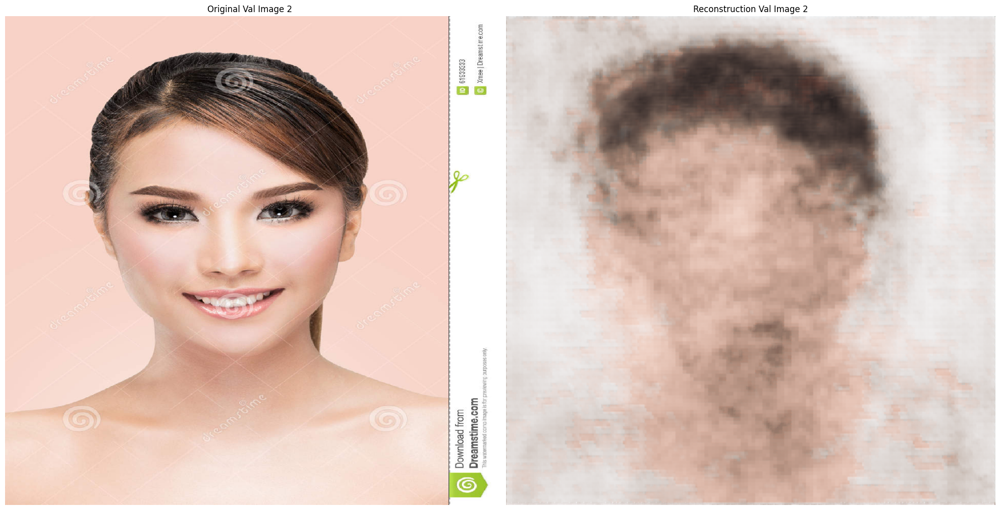

In [66]:
# Show first 3 training images
print("Training Images:")
for i in range(3):
   image_tensor = convert_image_to_tensor(images[i], target_width=1080, target_height=1080)
   image_tensor = image_tensor.unsqueeze(0)  # Add batch dimension
   
   with torch.no_grad():
       reconstruction, _ = model(image_tensor.to(device))
       show_images([image_tensor[0].cpu(), reconstruction.cpu()], 
                   num_cols=2, 
                   figsize=(20,10),
                   titles=[f'Original Train Image {i}', f'Reconstruction Train Image {i}'])

# Show first 3 validation images        
print("\nValidation Images:")
for i in range(3):
   val_image_tensor = convert_image_to_tensor(val_images[i], target_width=1080, target_height=1080)
   val_image_tensor = val_image_tensor.unsqueeze(0)  # Add batch dimension
   
   with torch.no_grad():
       reconstruction, _ = model(val_image_tensor.to(device))
       show_images([val_image_tensor[0].cpu(), reconstruction.cpu()], 
                   num_cols=2, 
                   figsize=(20,10),
                   titles=[f'Original Val Image {i}', f'Reconstruction Val Image {i}'])

In [68]:
print(len(images))
# Save model state dictionary
torch.save(model.state_dict(), 'AutoEncoder_State.pth')
print(f"Model state saved as: AutoEncoder_State.pth")
# model.load_state_dict(torch.load('autoencoder_state.pth')) # to load model

5590
Model state saved as: AutoEncoder_State.pth
